In [1]:
import pandas as pd 
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree 
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score , roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv("/Users/ekcs011/Downloads/Decision tree/winequality_red.csv")

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [8]:
ProfileReport(df)

In [9]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
x = df.drop(columns='quality')

In [6]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [7]:
y = df.quality

In [8]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [94]:
x_train , x_test, y_train,y_test = train_test_split(x,y,test_size = .25,random_state = 30)

In [95]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [11]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [12]:
dt_model = DecisionTreeClassifier()

In [13]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [14]:
import sklearn
import  matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline 

In [15]:
sklearn.__version__

'0.24.2'

[Text(613.9225632962642, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(360.8048815050745, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(226.38626916432736, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(85.31610343338372, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(59.44790541999568, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.278773483049015, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(11.56726408982941, 694.6, 'X[0] <= 7.1\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(7.711509393219607, 634.2, 'X[8] <= 3.435\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(3.8557546966098033, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0, 0]'),
 Text(11.567264089829

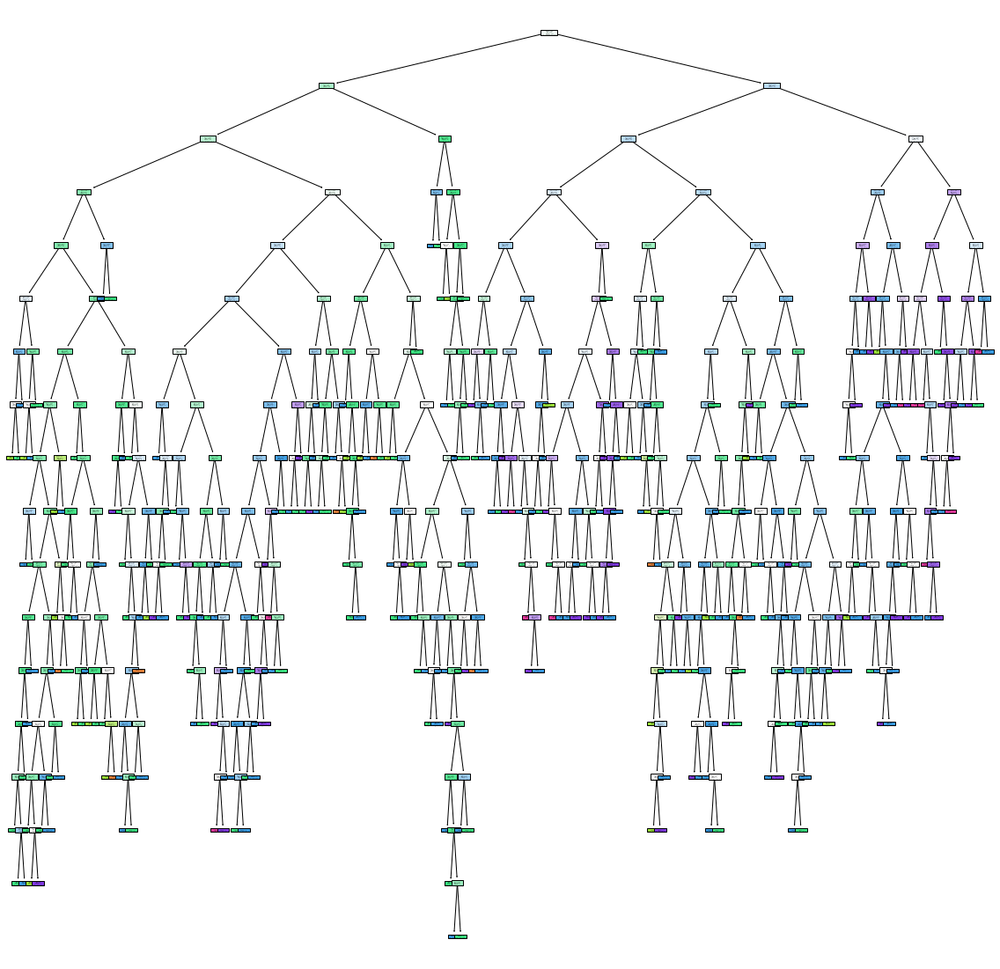

In [16]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [17]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [18]:
df1 = df.head(500)

In [19]:
x1 = df1.drop(columns='quality')

In [20]:
y1 = df1.quality

In [21]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

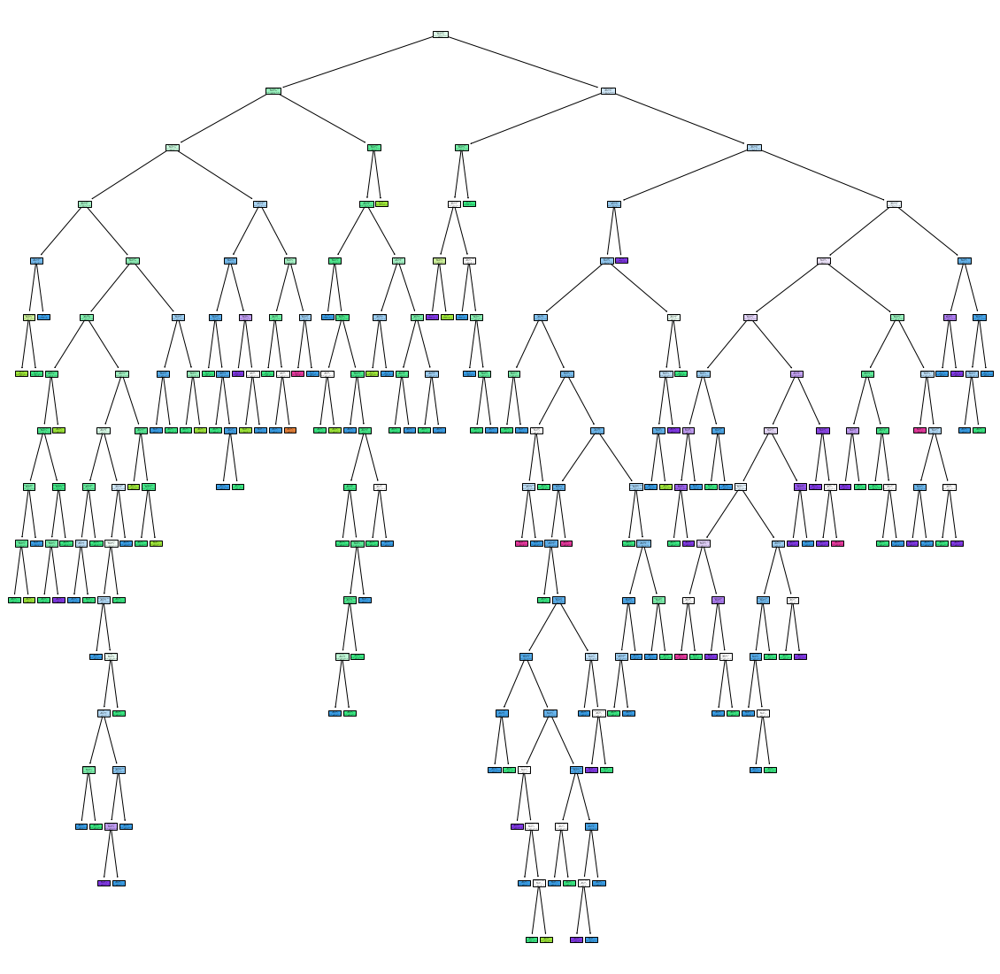

In [22]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)] ,feature_names=x1.columns)
plt.savefig('dt_model_1')

In [23]:
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [24]:
[str(i) for i in set(y1)]

['3', '4', '5', '6', '7', '8']

In [25]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [26]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [27]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [28]:
dt_model1.score(x1,y1)

1.0

In [29]:
dt_model1.score(x_test, y_test)

0.595

In [30]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas

In [31]:
ccp_alpha

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00188235, 0.00192308, 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.00261111, 0.00262769,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00271329, 0.00272222,
       0.00285714, 0.003     , 0.003     , 0.003     , 0.003     ,
       0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
       0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
       0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
       0.00373333, 0.00373809, 0.0038    , 0.0038237 , 0.004     ,
       0.00404444, 0.00428571, 0.00428571, 0.00437662, 0.00462338,
       0.00465709, 0.00466667, 0.0048    , 0.00487179, 0.00504242,
       0.00508235, 0.00509091, 0.00510606, 0.00516667, 0.00568485,
       0.00589394, 0.00656364, 0.00671079, 0.0067591 , 0.00688

In [32]:
dt_modle2 = []
for ccp in ccp_alpha:
    dt_m  = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_modle2.append(dt_m)

Text(0, 0.5, 'score')

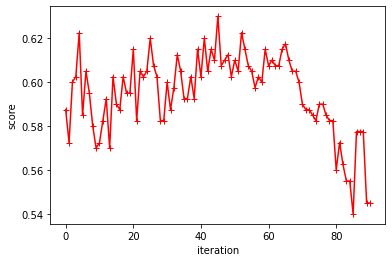

In [33]:
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))

    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [34]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 Dec

In [35]:
train_score = [i.score(x1,y1) for i in dt_modle2]

In [36]:
test_score = [i.score(x_test ,y_test) for i in dt_modle2]

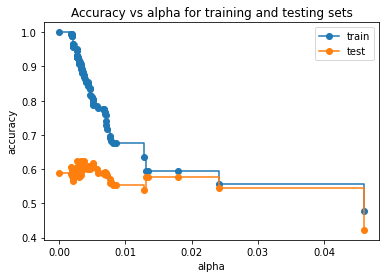

In [37]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [38]:
dt_model_ccp = DecisionTreeClassifier(random_state=0 , ccp_alpha=.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

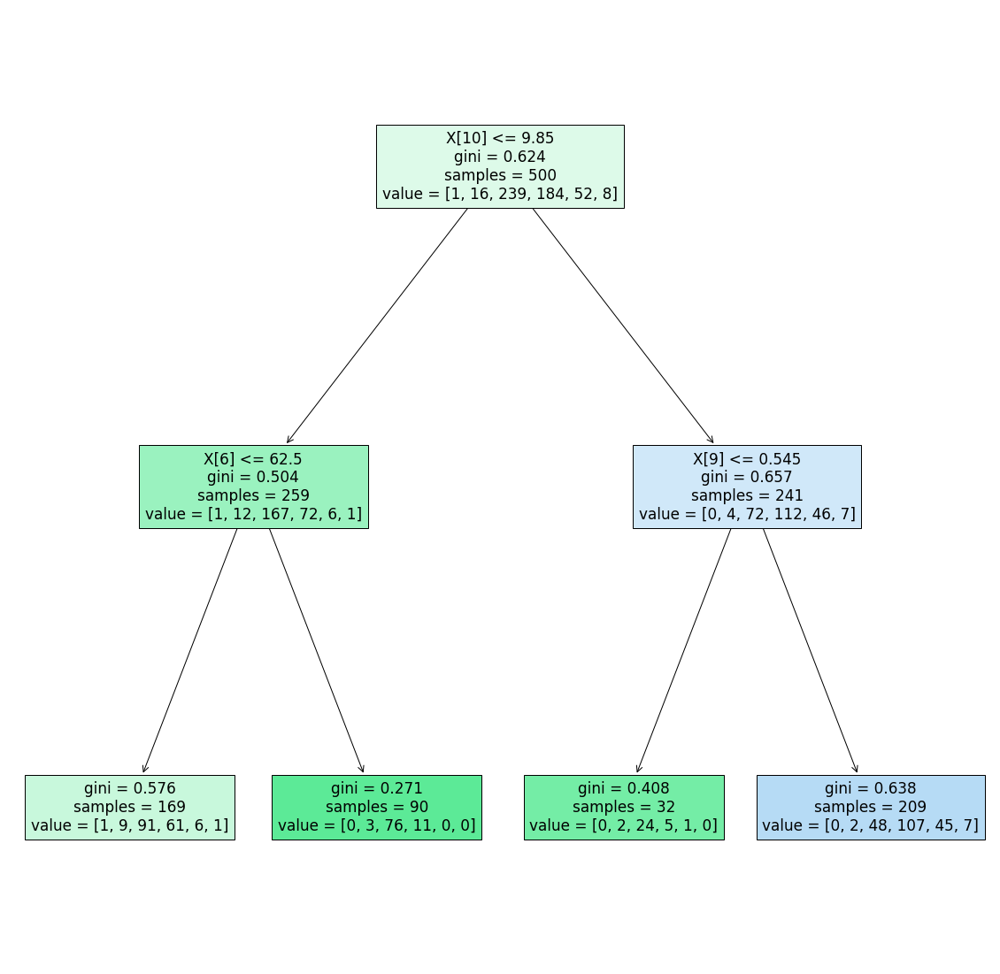

In [39]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [40]:
dt_model_ccp.score(x1,y1)

0.596

In [41]:
dt_model_ccp.score(x_test,y_test)

0.5775

In [42]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [43]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20)
             }

In [44]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram , cv = 10 , n_jobs=-1)

In [45]:
#grid_ccp.fit(x1,y1)

In [46]:
grid_ccp.best_params_

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

In [47]:
dt_cpp_new = DecisionTreeClassifier(criterion='entropy' , max_depth=17 ,min_samples_leaf=1 , min_samples_split=3 , splitter='random',ccp_alpha=0.014)

In [48]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_split=3, splitter='random')

In [49]:
dt_cpp_new.score(x1,y1)

0.648

In [50]:
dt_cpp_new.score(x_test,y_test)

0.4925

In [51]:
pred = dt_cpp_new.predict(x_train)

In [52]:
confusion_matrix(y_train,pred)

array([[  0,   0,   5,   3,   0,   0],
       [  0,   1,  19,  10,   5,   0],
       [  0,   2, 344, 134,  32,   0],
       [  0,   1, 193, 181, 102,   0],
       [  0,   1,  19,  77,  56,   0],
       [  0,   0,   3,   7,   4,   0]])

##### 9 OCT classs

In [53]:
x = df.drop(columns=['quality'])

In [54]:
y = df.quality

In [55]:
from sklearn.ensemble import BaggingClassifier

In [56]:
x_train,x_test,y_train,y_test = train_test_split(x,y,random_state = 0)

In [57]:
bag_dt = BaggingClassifier(DecisionTreeClassifier(), n_estimators=10)

In [58]:
bag_dt.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [59]:
bag_dt.predict(x_test)

array([5, 5, 7, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 4, 6, 7, 7, 5, 5, 6, 6, 6,
       6, 6, 5, 5, 5, 6, 5, 6, 6, 6, 6, 5, 7, 7, 5, 6, 6, 4, 5, 7, 6, 7,
       5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 5, 5, 5, 7, 5, 5, 5, 6, 5, 5, 6,
       5, 5, 6, 6, 5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 5, 5, 6, 7, 6, 5, 6, 5,
       5, 5, 5, 6, 6, 5, 7, 5, 7, 5, 6, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 6, 5, 6, 6, 5, 7, 6, 6, 5, 5, 5, 5, 6, 6, 5, 5, 6, 6, 6, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 6, 6, 5, 5, 6, 7, 5, 6,
       6, 6, 6, 6, 6, 5, 6, 6, 7, 5, 5, 5, 6, 6, 6, 6, 5, 6, 4, 7, 5, 6,
       6, 7, 7, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 7, 6, 5, 6, 6, 5, 5, 5, 5,
       5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 6, 6, 5,
       5, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 5, 5, 6, 5, 5, 5, 7, 5, 6, 5, 6,
       5, 4, 5, 5, 6, 6, 4, 5, 5, 5, 5, 6, 7, 6, 6, 6, 5, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 6,

In [60]:
bag_dt.base_estimator_

DecisionTreeClassifier()

In [61]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8])

In [62]:
bag_dt.estimator_params

()

In [63]:
from sklearn.neighbors import KNeighborsClassifier

In [64]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6), n_estimators=10)

In [65]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [66]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 6, 7, 6, 5, 6, 6, 6,
       6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 7, 6, 5, 6, 6, 6, 6, 7, 6, 5,
       6, 6, 5, 6, 5, 5, 6, 5, 5, 7, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 6, 5,
       5, 7, 7, 7, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       6, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 7, 5, 6, 6, 5, 6, 5, 6, 6, 5,
       6, 5, 6, 6, 5, 7, 5, 7, 7, 6, 5, 7, 6, 5, 7, 5, 5, 5, 5, 6, 5, 5,
       5, 7, 6, 5, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 6, 6, 5, 6, 6, 5, 6, 6,
       6, 6, 6, 6, 6, 6, 7, 6, 5, 6, 5, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 6,
       7, 7, 6, 5, 5, 6, 6, 4, 6, 5, 6, 6, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 6, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 6, 6, 6, 5, 7, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 7, 6, 5, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 5, 5, 5, 6, 5, 6, 5, 5, 5, 5, 7,

In [67]:
from sklearn.ensemble import RandomForestClassifier

In [68]:
rf = RandomForestClassifier( n_estimators=5)

In [69]:
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=5)

In [70]:
rf.score(x_test,y_test)

0.64

In [71]:
bag_dt.score(x_test,y_test)

0.695

In [72]:
bag_knn.score(x_test,y_test)

0.5025

In [73]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=2139698618),
 DecisionTreeClassifier(max_features='auto', random_state=2016276846),
 DecisionTreeClassifier(max_features='auto', random_state=639121567),
 DecisionTreeClassifier(max_features='auto', random_state=1587671863),
 DecisionTreeClassifier(max_features='auto', random_state=839325073)]

In [74]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=2139698618)

[Text(686.6870052939967, 1060.02, 'X[6] <= 81.5\ngini = 0.65\nsamples = 774\nvalue = [7, 36, 538, 424, 181, 13]'),
 Text(313.0516421669408, 1005.6600000000001, 'X[1] <= 0.365\ngini = 0.667\nsamples = 637\nvalue = [7, 33, 386, 390, 170, 12]'),
 Text(87.1875, 951.3000000000001, 'X[7] <= 0.996\ngini = 0.654\nsamples = 123\nvalue = [0, 3, 30, 81, 82, 7]'),
 Text(44.05263157894736, 896.94, 'X[9] <= 0.79\ngini = 0.534\nsamples = 41\nvalue = [0, 0, 5, 27, 44, 0]'),
 Text(39.1578947368421, 842.58, 'X[5] <= 14.0\ngini = 0.575\nsamples = 31\nvalue = [0, 0, 5, 27, 21, 0]'),
 Text(29.368421052631575, 788.22, 'X[2] <= 0.54\ngini = 0.598\nsamples = 22\nvalue = [0, 0, 5, 12, 18, 0]'),
 Text(24.473684210526315, 733.8600000000001, 'X[0] <= 8.35\ngini = 0.58\nsamples = 20\nvalue = [0, 0, 5, 9, 18, 0]'),
 Text(9.789473684210526, 679.5, 'X[6] <= 10.5\ngini = 0.617\nsamples = 9\nvalue = [0, 0, 3, 8, 5, 0]'),
 Text(4.894736842105263, 625.1400000000001, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 0, 4, 0]'),

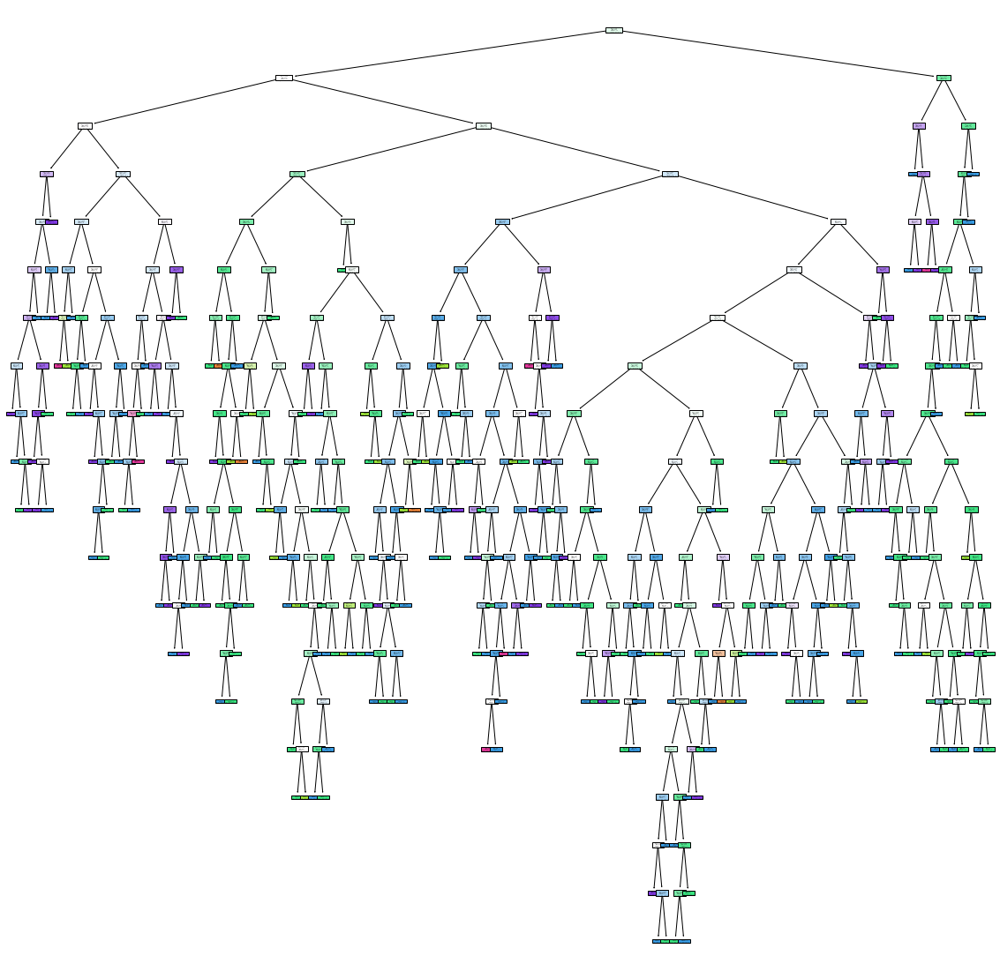

In [75]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[0],filled=True)

In [76]:
rf.estimators_[2]

DecisionTreeClassifier(max_features='auto', random_state=639121567)

[Text(633.9482644543974, 1060.02, 'X[6] <= 48.5\ngini = 0.642\nsamples = 763\nvalue = [7, 43, 535, 452, 147, 15]'),
 Text(335.7760077361564, 1005.6600000000001, 'X[9] <= 0.585\ngini = 0.673\nsamples = 462\nvalue = [7, 33, 257, 311, 119, 11]'),
 Text(166.11064739413683, 951.3000000000001, 'X[10] <= 11.45\ngini = 0.579\nsamples = 172\nvalue = [6, 21, 156, 74, 12, 0]'),
 Text(115.32227198697069, 896.94, 'X[6] <= 37.5\ngini = 0.511\nsamples = 144\nvalue = [6, 20, 151, 44, 6, 0]'),
 Text(70.69666123778502, 842.58, 'X[7] <= 0.995\ngini = 0.398\nsamples = 105\nvalue = [6, 7, 126, 20, 6, 0]'),
 Text(47.560260586319224, 788.22, 'X[4] <= 0.068\ngini = 0.693\nsamples = 10\nvalue = [0, 2, 6, 2, 5, 0]'),
 Text(37.86644951140065, 733.8600000000001, 'X[4] <= 0.057\ngini = 0.408\nsamples = 4\nvalue = [0, 0, 2, 0, 5, 0]'),
 Text(33.01954397394137, 679.5, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 2, 0, 0, 0]'),
 Text(42.71335504885994, 679.5, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 0, 0, 5, 0]'),
 Text(

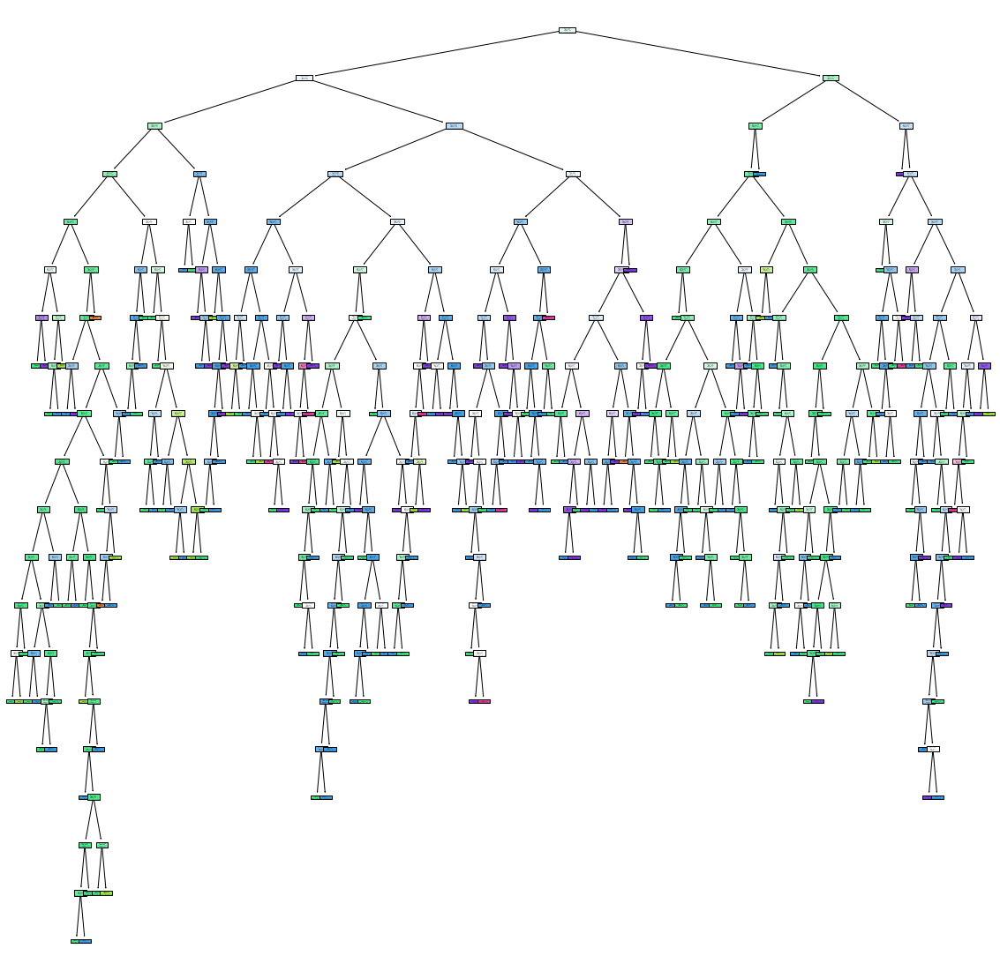

In [77]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[2],filled=True)

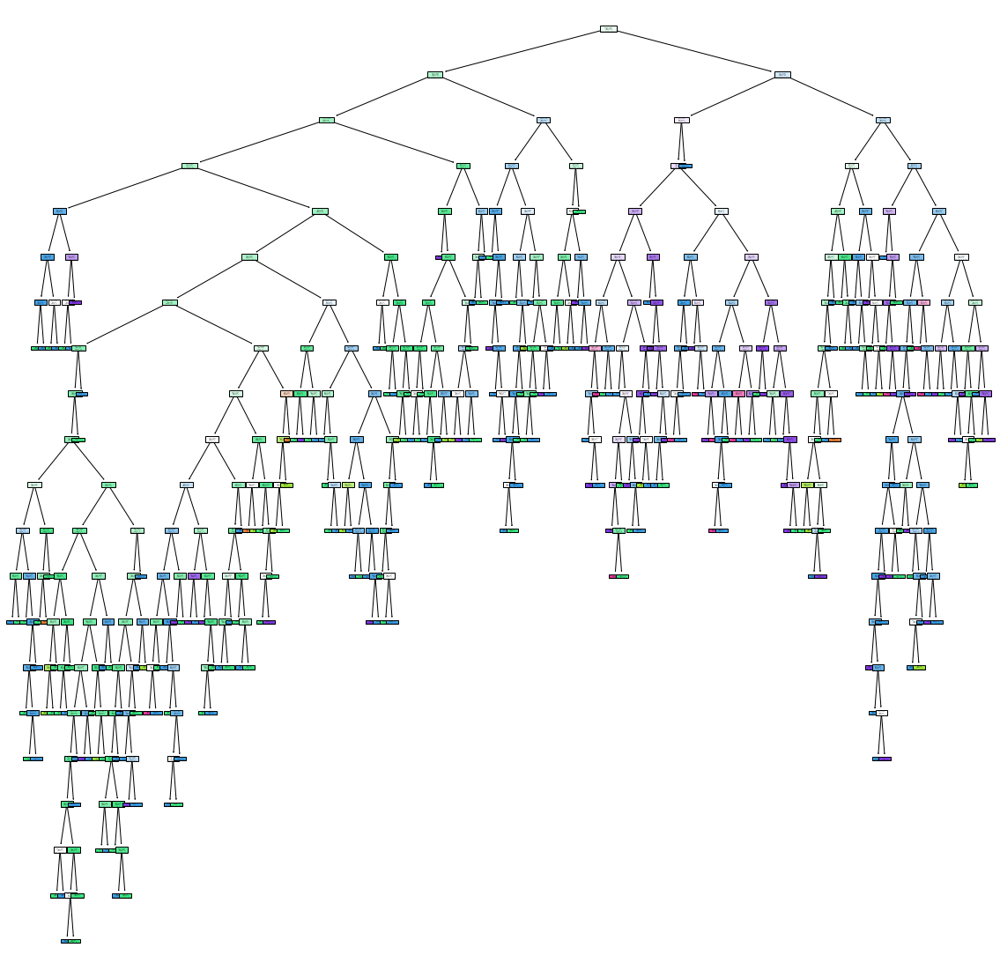

In [78]:
plt.figure(figsize = (20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i],filled=True)

In [79]:
grid_parm = {
    "n_estimators": [5,10,50,100,120,150],
    "criterion":['gini','entropy'],
    "max_depth": range(10),
    'min_samples_leaf':range(10)
}

In [80]:
rf = RandomForestClassifier( n_estimators=5)

In [81]:
##grid_search_rf = GridSearchCV(param_grid=grid_parm,cv=10,n_jobs=10,verbose=1,estimator=rf)

In [82]:
##grid_search_rf.fit(x_train,y_train)

In [83]:
grid_search_rf.best_params_

NameError: name 'grid_search_rf' is not defined

In [85]:
rf_new = RandomForestClassifier(criterion='entropy',max_depth=9, n_estimators=120)

In [86]:
rf_new.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=120)

In [88]:
rf_new.score(x_test,y_test)

0.6725

[Text(485.7289156626506, 1032.8400000000001, 'X[10] <= 10.35\nentropy = 1.682\nsamples = 746\nvalue = [6, 41, 527, 472, 142, 11]'),
 Text(171.74887048192772, 924.1200000000001, 'X[1] <= 0.305\nentropy = 1.267\nsamples = 412\nvalue = [2, 23, 407, 200, 15, 0]'),
 Text(50.42168674698795, 815.4000000000001, 'X[2] <= 0.43\nentropy = 1.621\nsamples = 21\nvalue = [0, 2, 6, 19, 7, 0]'),
 Text(26.89156626506024, 706.6800000000001, 'X[2] <= 0.38\nentropy = 1.324\nsamples = 9\nvalue = [0, 2, 6, 11, 0, 0]'),
 Text(13.44578313253012, 597.96, 'X[4] <= 0.062\nentropy = 0.684\nsamples = 5\nvalue = [0, 2, 0, 9, 0, 0]'),
 Text(6.72289156626506, 489.24, 'entropy = 0.0\nsamples = 1\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(20.16867469879518, 489.24, 'entropy = 0.0\nsamples = 4\nvalue = [0, 0, 0, 9, 0, 0]'),
 Text(40.33734939759036, 597.96, 'X[8] <= 3.245\nentropy = 0.811\nsamples = 4\nvalue = [0, 0, 6, 2, 0, 0]'),
 Text(33.6144578313253, 489.24, 'X[4] <= 0.071\nentropy = 0.971\nsamples = 3\nvalue = [0, 0, 3, 2

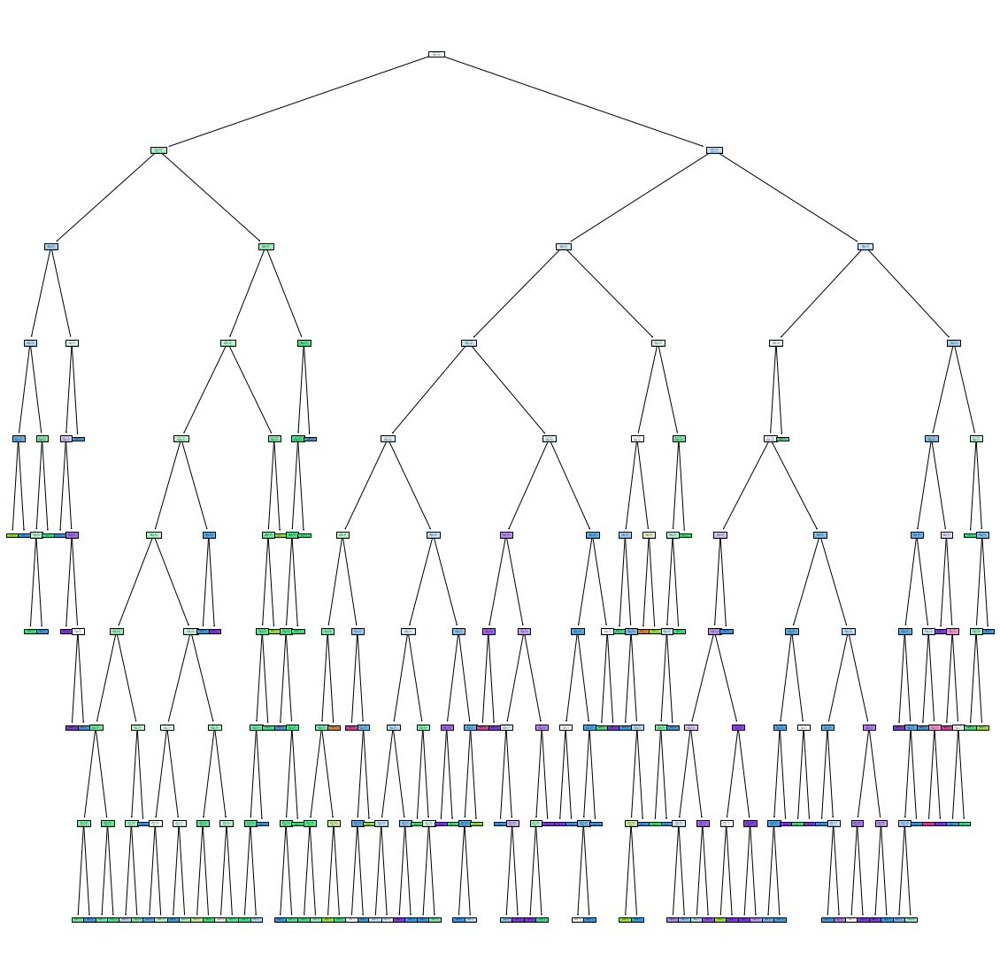

In [89]:
plt.figure(figsize = (20,20))
tree.plot_tree(rf_new.estimators_[i],filled=True)

## KNN SVM AND stacking 10 oct class

In [90]:
import pandas as pd 
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree 
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score , roc_curve
from pandas_profiling import ProfileReport

In [91]:
x_train,y_train,x_test,y_test = train_test_split(x,y)

In [92]:
knn = KNeighborsClassifier()

In [93]:
knn.fit(x_train,y_train)

ValueError: Found input variables with inconsistent numbers of samples: [1199, 400]